In [26]:
import pandas as pd
import numpy as np

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_mutual_info_score as ads
from sklearn.metrics import normalized_mutual_info_score as nis
from sklearn.metrics import mutual_info_score as mis
from random import randint

import torch
from torch.utils.data import DataLoader
from Datasets import EmbeddedDataset, CDRH3MotifDataset
from Models import VaeEmb, VaeCdrh3

np.random.seed(42)

import plotly.express as px

In [27]:
import umap

# Read the data

In [28]:
use_cuda = True
cpu_device = torch.device('cpu')
if torch.cuda.is_available() and use_cuda:
    device = torch.device('cuda:0')
    print('GPU device count:', torch.cuda.device_count())
else:
    device = torch.device('cpu')

print('Device in use: ', device)

GPU device count: 1
Device in use:  cuda:0


In [29]:
#transformer_data = np.load("seq_repr.npz")
MODEL_PATH = 'vae_iter_220-2000-500-20-500-2000-220_50_b10.0.pt'
DEVICE = 'cuda:0'  # change to 'cpu' if training on cpu
n_samples = 10000

dataset = CDRH3MotifDataset('hackathon.csv', device=DEVICE)
data = DataLoader(dataset, batch_size=190_000, shuffle=True, num_workers=0,
                  drop_last=False, prefetch_factor=2)

model = VaeCdrh3.load(MODEL_PATH, device)
# get latent space from
with torch.no_grad():
    data_point, labels, r = next(iter(data))
    data_point = data_point.to(device)
    data_point = data_point.view(-1, model.motif_length * model.aa_number)
    mu, _ = model.encode(data_point)
    latent = mu

data = latent.data.cpu().numpy()
labels = labels.data.cpu().numpy()

idx = np.random.randint(len(data), size=n_samples)
data = data[idx]
labels = np.array(r)[2][idx]


In [30]:
data

array([[ 2.3489525 ,  0.1389474 , -2.6375625 , ..., -1.5102444 ,
        -1.4669    ,  0.07750358],
       [-1.8598005 , -0.5661352 , -1.8047152 , ...,  3.7334182 ,
         1.0387352 ,  2.5703027 ],
       [ 0.12097231, -0.01282201,  1.4807398 , ..., -0.4742395 ,
         1.4603268 , -1.7841198 ],
       ...,
       [-0.9858219 , -0.14835177, -0.9689983 , ..., -0.22289103,
         2.214792  , -0.7085977 ],
       [ 1.5922818 ,  0.7499528 , -2.0029929 , ...,  0.44937703,
        -0.44934273,  0.7042295 ],
       [-1.2320908 ,  1.4650445 , -2.3675036 , ...,  0.92014354,
        -1.2556324 , -0.7187403 ]], dtype=float32)

In [31]:
data.shape

(10000, 20)

In [32]:
labels

array(['Ag34', 'Ag98', 'Ag44', ..., 'Ag63', 'Ag44', 'Ag63'], dtype='<U24')

In [33]:
labels.shape

(10000,)

In [34]:
#data = pd.DataFrame(data)
#labels = pd.DataFrame(labels)

#rows = [randint(0, len(data)) for p in range(0, 10000)]


#data = data.iloc[rows,:].values
#labels = labels.iloc[rows,:].values.ravel()

In [35]:
labels.shape


(10000,)

In [36]:
data.shape

(10000, 20)

In [37]:
#data = data[0:500,:]
#labels = labels[0:500]

In [38]:
cmap = plt.get_cmap('viridis')
colors  = cmap(np.linspace(0, 1, len(labels)))

# Take a quick look at the data with UMAP

In [39]:
pca = PCA(n_components=10)
fit = umap.UMAP()
# fit = TSNE(n_components=2)
x = pca.fit_transform(data)

%time u = fit.fit_transform(x)

Wall time: 9.77 s


In [40]:
#plt.scatter(u[:,0], u[:,1], c=colors, alpha=0.5)
#plt.title('UMAP embedding of the data');

fig = px.scatter(u, x=0, y=1, color=labels)
fig.show()

# Visualize the data with different parameters

In [41]:
all_metrics = {}

In [42]:
def calc_metrics(u, labels):

    # clustering
    kmeans = KMeans(n_clusters=10).fit(u)
    # eval clustering
    

    #for i in zip(np.array(labels), kmeans.labels_):
    #    print(i)
    
    return([ads(np.array(labels), kmeans.labels_), nis(np.array(labels), kmeans.labels_),
           mis(np.array(labels), kmeans.labels_)])

def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(x);
    fig = plt.figure()
    if n_components == 1:
        fig = px.scatter(u, x=0, y=1, color=labels)
        fig.show()
    if n_components == 2:
        fig = px.scatter(u, x=0, y=1, color=labels)
        fig.show()
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=colors,
            cmap=plt.get_cmap('tab10'), alpha=0.5, s=100)
    
    all_metrics[str(n_neighbors), str(min_dist), str(n_components), str(metric)] = calc_metrics(u, labels)
    

In [43]:
pca = PCA(n_components=10)
x = pca.fit_transform(data)
fig = px.scatter(x, x=0, y=1, color=labels)
fig.show()


all_metrics[str("PCA"), str("PCA"), str("PCA"), str("PCA")] = calc_metrics(x, labels)

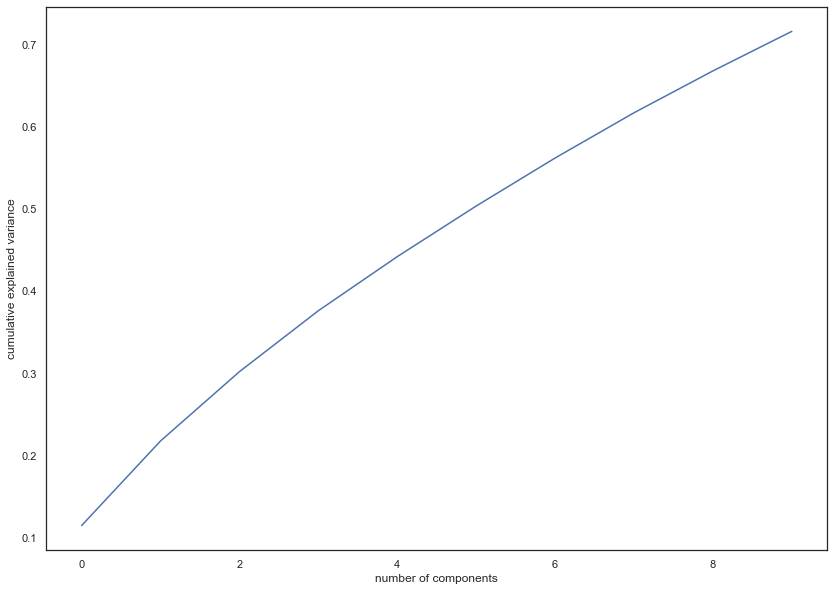

In [44]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [45]:
for n in (2, 5, 10, 20, 50, 100, 200):
    print(n)
    draw_umap(n_neighbors=n, title='n_neighbors = {}'.format(n))

2
C:\Users\krzys\anaconda3\envs\spectra_vae\lib\site-packages\umap\spectral.py:256: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\krzys\anaconda3\envs\spectra_vae\lib\site-packages\umap\spectral.py:256: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\krzys\anaconda3\envs\spectra_vae\lib\site-packages\umap\spectral.py:256: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\krzys\anaconda3\envs\spectra_vae\lib\site-packages\umap\spectral.py:256: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\krzys\anaconda3\envs\spec

5


10


20


50


100


200


<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

In [46]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(min_dist=d, title='min_dist = {}'.format(d))

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

In [47]:
for m in ("euclidean", "correlation", "manhattan", "chebyshev", "minkowski"):
    name = m if type(m) is str else m.__name__
    draw_umap(n_components=2, metric=m, title='metric = {}'.format(name))
    




<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

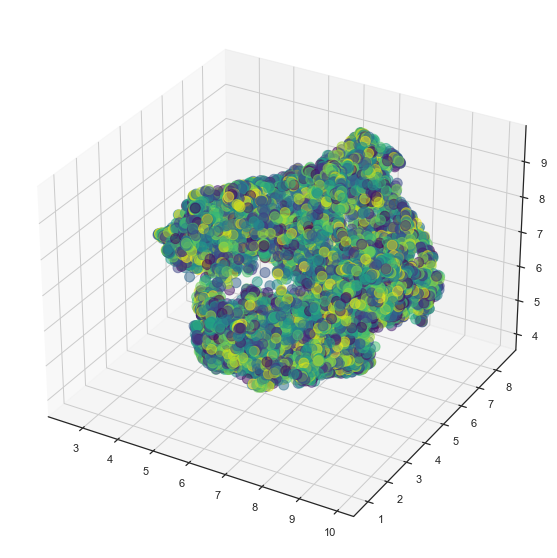

In [48]:
draw_umap(n_components=3, title='n_components = 3')

In [49]:
all_metrics = pd.DataFrame(all_metrics).T
all_metrics.columns = ["adjusted_mutual_info_score", "normalized_mutual_info_score", "mutual_info_score"]

In [50]:
all_metrics


adjusted_mutual_info_score  \
PCA PCA  PCA PCA                            0.080721   
2   0.1  2   euclidean                      0.008059   
5   0.1  2   euclidean                      0.075322   
10  0.1  2   euclidean                      0.079104   
20  0.1  2   euclidean                      0.083900   
50  0.1  2   euclidean                      0.082583   
100 0.1  2   euclidean                      0.074703   
200 0.1  2   euclidean                      0.083497   
15  0.0  2   euclidean                      0.069053   
    0.1  2   euclidean                      0.082284   
    0.25 2   euclidean                      0.076413   
    0.5  2   euclidean                      0.084335   
    0.8  2   euclidean                      0.080725   
    0.99 2   euclidean                      0.079423   
    0.1  2   correlation                    0.082204   
             manhattan                      0.075260   
             chebyshev                      0.074666   
             minkowski                      0.082231   
         3   euclidean                      0.076768   

                          normalized_mutual_info_score  mutual_info_score  
PCA PCA  PCA PCA                              0.082369           0.186568  
2   0.1  2   euclidean                        0.009824           0.022409  
5   0.1  2   euclidean                        0.076973           0.174928  
10  0.1  2   euclidean                        0.080751           0.183288  
20  0.1  2   euclidean                        0.085533           0.194770  
50  0.1  2   euclidean                        0.084217           0.191831  
100 0.1  2   euclidean                        0.076357           0.173470  
200 0.1  2   euclidean                        0.085129           0.193980  
15  0.0  2   euclidean                        0.070730           0.159397  
    0.1  2   euclidean                        0.083919           0.191191  
    0.25 2   euclidean                        0.078061           0.177639  
    0.5  2   euclidean                        0.085965           0.196086  
    0.8  2   euclidean                        0.082360           0.187948  
    0.99 2   euclidean                        0.081060           0.185035  
    0.1  2   correlation                      0.083839           0.191067  
             manhattan                        0.076913           0.174671  
             chebyshev                        0.076318           0.173625  
             minkowski                        0.083865           0.191179  
         3   euclidean                        0.078435           0.176361

# Visualize the metrics